<a href="https://colab.research.google.com/github/amarjuma2010/YOLOv4-for-sedimentary-structures/blob/main/Object_detection_for_sedimentary_structures.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Clone Darknet
!git clone https://github.com/AlexeyAB/darknet.git

# Navigate to darknet folder
%cd darknet

# Modify Makefile to enable GPU, OpenCV, and CUDNN
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile

# Compile Darknet
!make


Cloning into 'darknet'...
remote: Enumerating objects: 15873, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 15873 (delta 12), reused 7 (delta 7), pack-reused 15850 (from 3)
Receiving objects: 100% (15873/15873), 14.50 MiB | 10.31 MiB/s, done.
Resolving deltas: 100% (10679/10679), done.
/content/darknet
mkdir -p ./obj/
mkdir -p backup
mkdir -p results
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -DCUDNN_HALF -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -rdynamic -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -DCUDNN_HALF -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:945:23: warning: variable

In [ ]:
!./darknet detector demo data/obj.data cfg/yolov4-custom.cfg weights/yolov4-custom_final.weights -dont_show -ext_output -out_filename videos/output1.mp4 videos/video1.mp4


Streaming output truncated to the last 5000 lines.
Broken pieces: 30% 	(left_x:  139   top_y:  373   width:  168   height:  177)
Bedding plane: 53% 	(left_x:   11   top_y: 1325   width:  157   height:   52)
Bedding plane: 45% 	(left_x:   12   top_y: 1358   width:  160   height:   56)

FPS:20.7 	 AVG_FPS:19.3

 cvWriteFrame 
Objects:

MD: 99% 	(left_x:  150   top_y:  564   width:  165   height:   93)
MD: 88% 	(left_x:    0   top_y:  406   width:   97   height:   34)
MD: 88% 	(left_x:  166   top_y:  791   width:  162   height:   55)
MD: 82% 	(left_x:  181   top_y:  957   width:  165   height:   68)
MD: 80% 	(left_x:  151   top_y:  517   width:  163   height:  100)
MD: 69% 	(left_x:  148   top_y:  502   width:  174   height:  211)
MD: 64% 	(left_x:  195   top_y: 1132   width:  165   height:   40)
MD: 56% 	(left_x:  154   top_y:  644   width:  169   height:   89)
MS: 34% , MD: 56% 	(left_x:    0   top_y:  439   width:   96   height:   30)
MD: 54% 	(left_x:    0   top_y:  482   width:   97 

In [ ]:
from google.colab import files
files.download("videos/output1.mp4")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!./darknet detector demo data/obj.data cfg/yolov4-custom.cfg weights/yolov4-custom_final.weights -dont_show -ext_output -out_filename videos/output2.mp4 videos/video2.mp4

Streaming output truncated to the last 5000 lines.
FPS:14.8 	 AVG_FPS:14.1

 cvWriteFrame 
Objects:

MD: 89% 	(left_x:  854   top_y:  516   width:  190   height:   50)
MD: 82% 	(left_x:  132   top_y:   97   width:  181   height:   45)
MD: 81% 	(left_x:    0   top_y:  786   width:  117   height:   42)
MD: 79% 	(left_x:  857   top_y: 1093   width:  189   height:   53)
MD: 79% 	(left_x:  150   top_y:  540   width:  181   height:   54)
MD: 74% 	(left_x:  851   top_y:  565   width:  195   height:   37)
MD: 74% 	(left_x:  150   top_y:  705   width:  186   height:   37)
MD: 72% 	(left_x:  148   top_y:  652   width:  188   height:   38)
MD: 71% 	(left_x:  855   top_y:  419   width:  190   height:   77)
MD: 70% 	(left_x:  132   top_y:   41   width:  183   height:   41)
MD: 70% 	(left_x:    0   top_y: 1064   width:  129   height:   58)
MD: 70% 	(left_x:  131   top_y:   56   width:  185   height:   41)
MD: 64% 	(left_x:  854   top_y:  854   width:  193   height:   47)
MD: 63% 	(left_x:  851   top

In [ ]:
from google.colab import files
files.download("videos/output2.mp4")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os

# Define paths
image_folder = "/content/darknet/images"
output_folder = "/content/darknet/detected_images"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Get list of images in the folder
image_files = [f for f in os.listdir(image_folder) if f.endswith(".jpg") or f.endswith(".png")]

# Run YOLO on each image
for image in image_files:
    input_path = f"images/{image}"
    output_path = f"{output_folder}/detected_{image}"

    # Run detection
    command = f"./darknet detector test data/obj.data cfg/yolov4-custom.cfg weights/yolov4-custom_final.weights {input_path} -dont_show -ext_output"
    os.system(command)

    # Move and rename the detected image
    os.system(f"mv predictions.jpg {output_path}")

print("Detection complete for all images.")


Detection complete for all images.


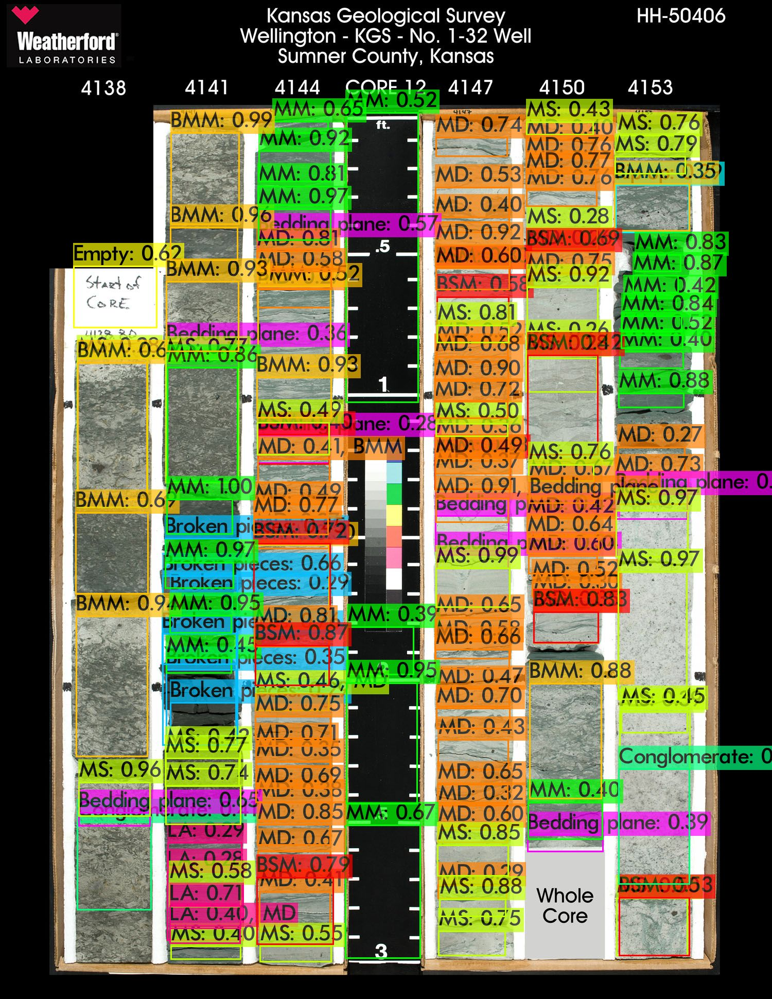

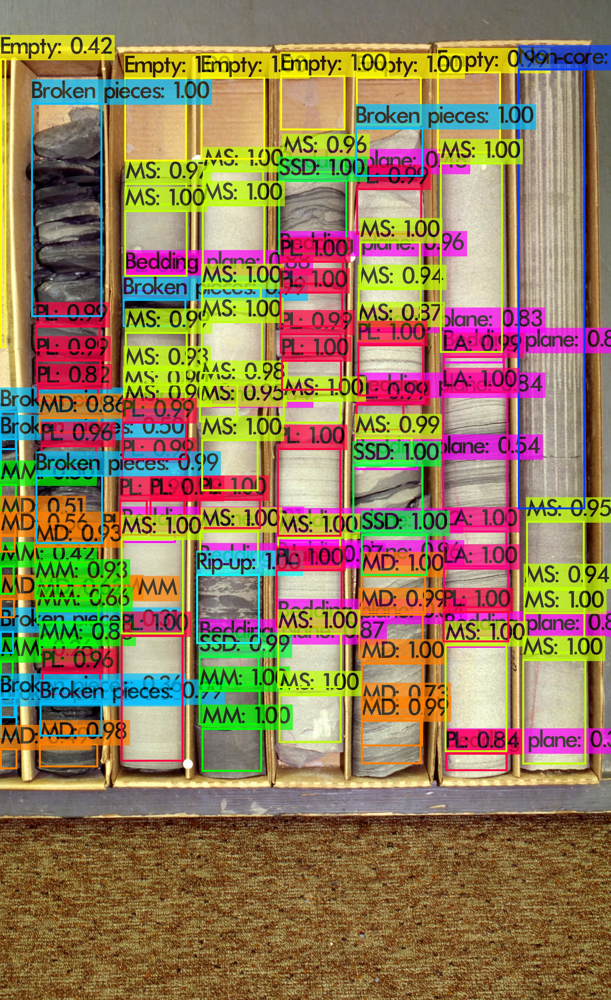

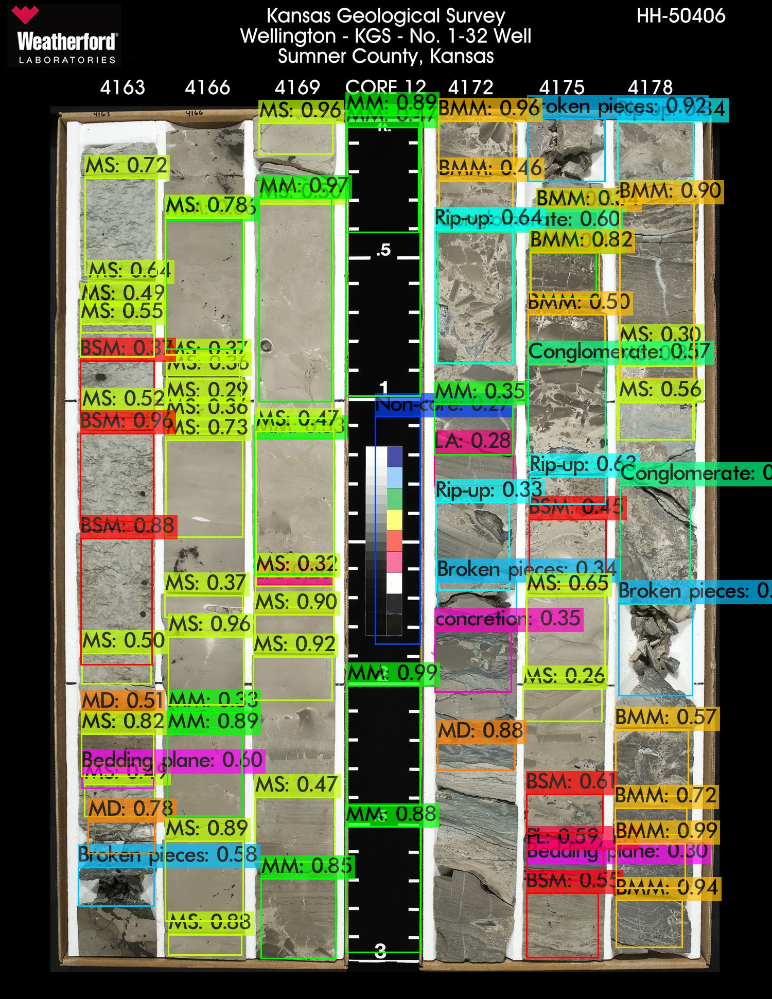

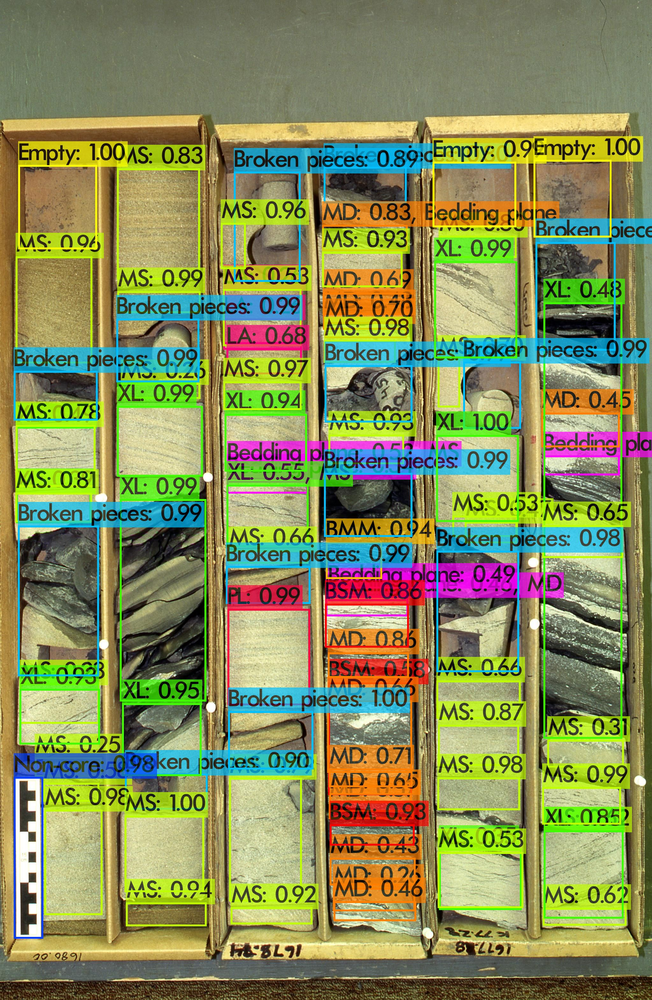

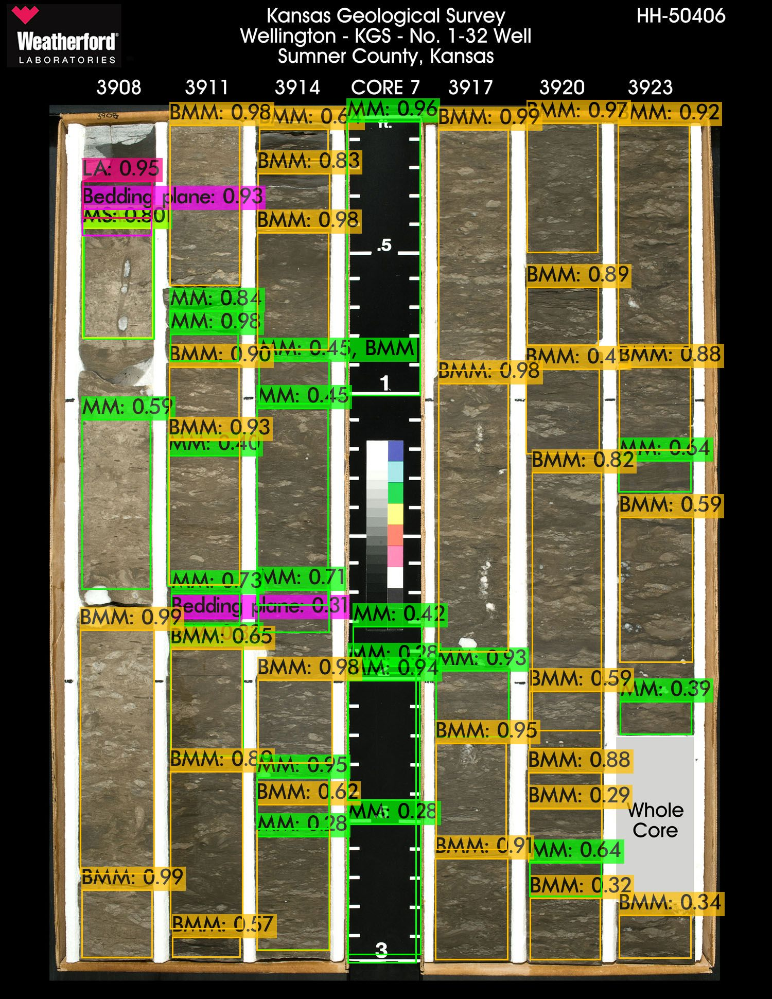

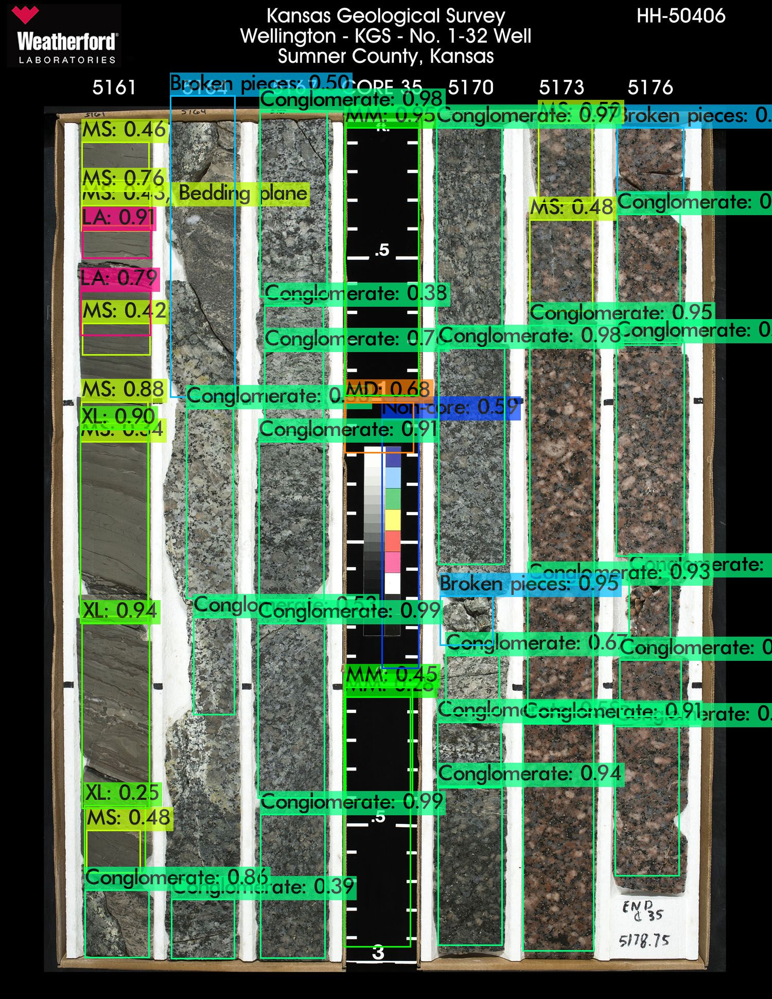

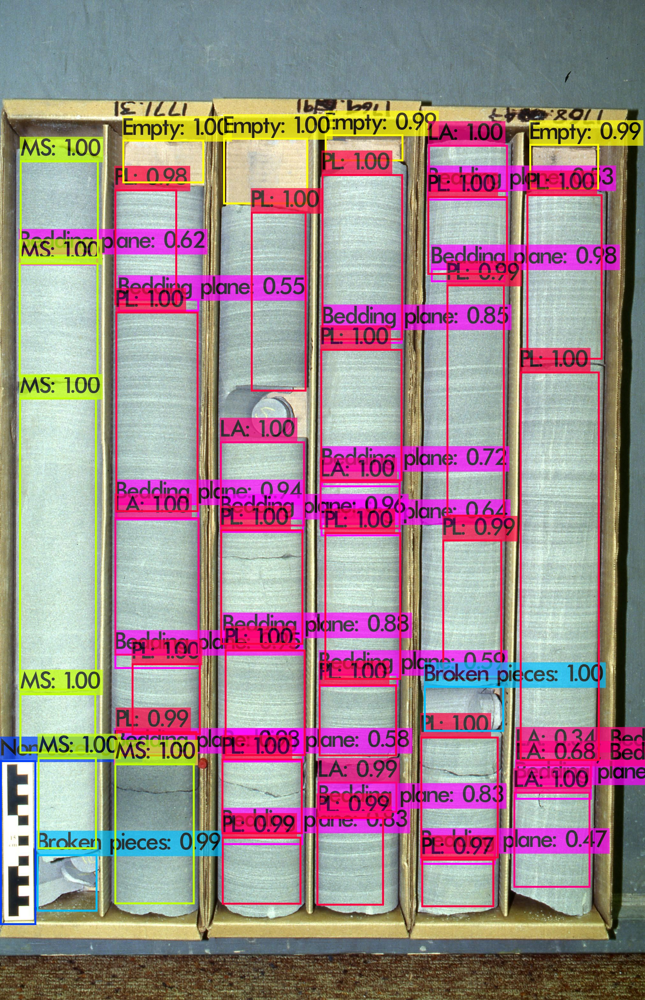

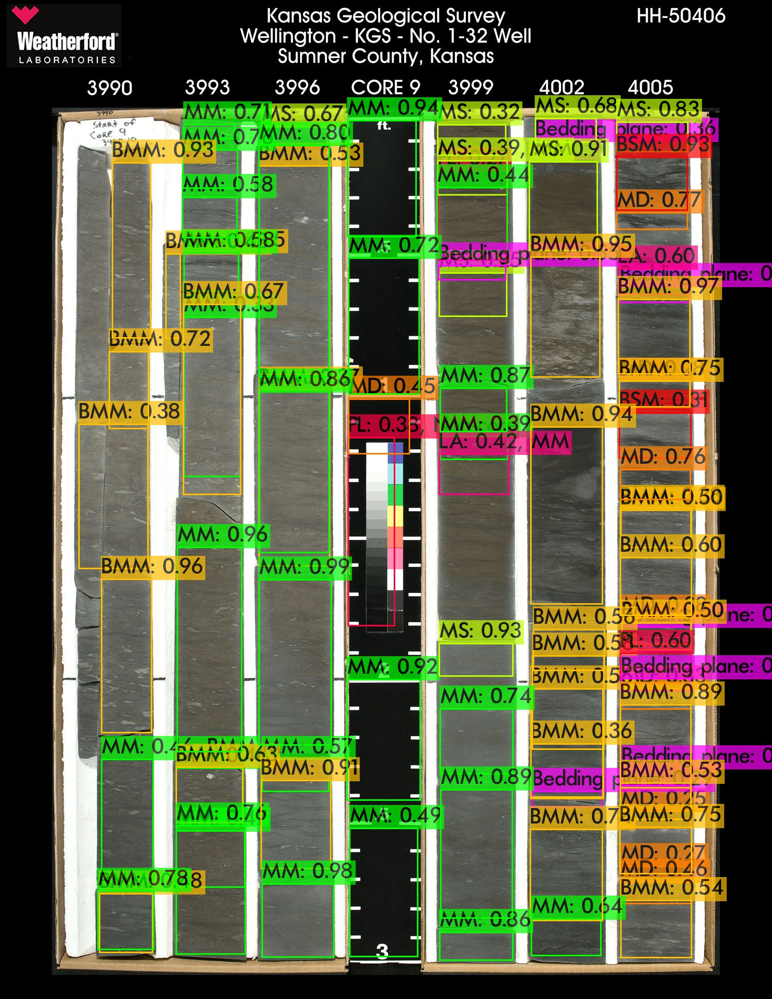

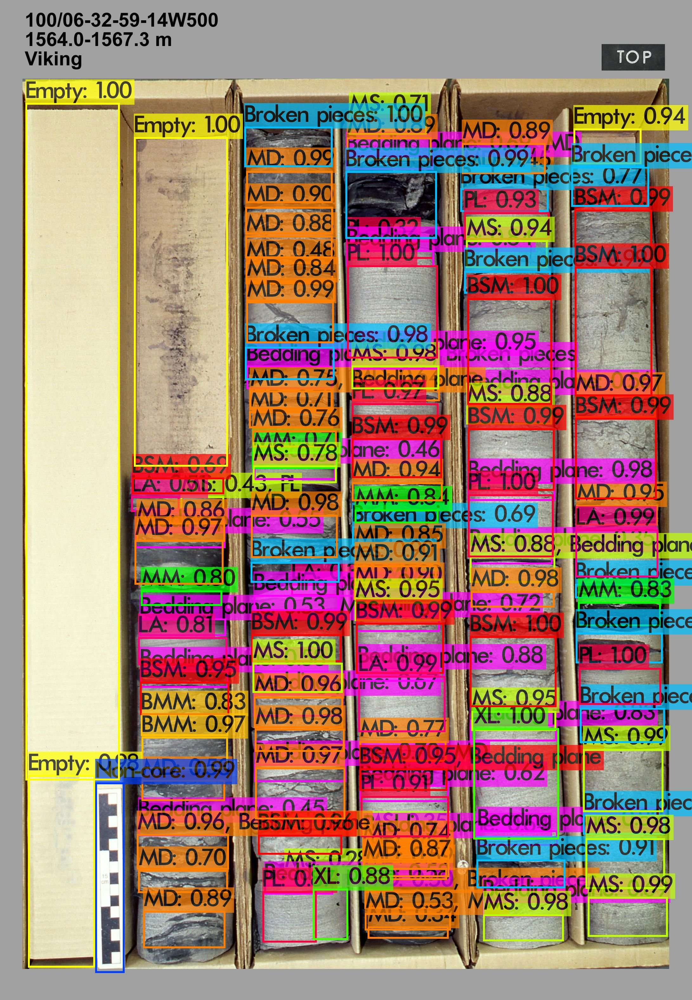

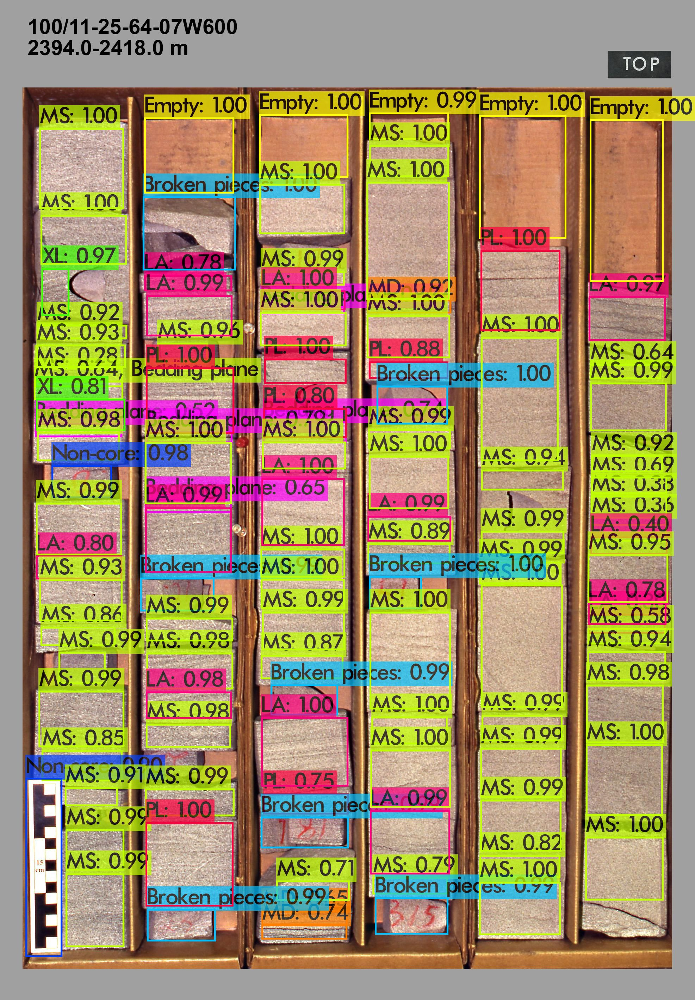

In [ ]:
from IPython.display import display, Image
import glob

detected_images = glob.glob("/content/darknet/detected_images/*.jpg")
for img_path in detected_images:
    display(Image(img_path))


In [ ]:
!git config --global user.email "amarjuma2010@hotmail.com"
!git config --global user.name "amarjuma2010"


In [ ]:
%cd /content/darknet
!git init
!git add .
!git commit -m "Initial commit with YOLOv4 setup"


/content/darknet
Reinitialized existing Git repository in /content/darknet/.git/
[master dded0d7] Initial commit with YOLOv4 setup
 4 files changed, 17 insertions(+), 17 deletions(-)
 create mode 100644 videos/output.mp4
 create mode 100644 videos/video.mp4


In [ ]:
!git remote add origin https://github.com/amarjuma2010/YOLOv4-Object-Detection.git
!git branch -M main
!git push -u origin main


error: remote origin already exists.
fatal: could not read Username for 'https://github.com': No such device or address
